### Problem scenario: ###

 - Marketing mix stands as a widely utilized concept in the execution of marketing strategies. It encompasses various facets within a comprehensive marketing plan, with a central focus on the four Ps of marketing: product, price, place, and promotion.

### Problem objective: ###

 - As a data scientist, you must conduct exploratory data analysis and hypothesis testing to enhance your comprehension of the diverse factors influencing customer acquisition.

### Data description: ###

 - The variables such as birth year, education, income, and others pertain to the first 'P' or 'People' in the tabular data presented to the user
 - The expenditures on items like wine, fruits, and gold, are associated with ‘Product’
 - Information relevant to sales channels, such as websites and stores, is connected to ‘Place’
 - The fields discussing promotions and the outcomes of various campaigns are linked to ‘Promotion’

#### Steps to perform: ####

- After importing the data, examine variables such as Dt_Customer and Income to verify their accurate importation.
- There are missing income values for some customers. Conduct missing value imputation, considering that customers with similar education and marital status tend to have comparable yearly incomes, on average.
    - It may be necessary to cleanse the data before proceeding. Specifically, scrutinize the categories of education and marital status for data cleaning.
- Create variables to represent the total number of children, age, and total spending.
- Derive the total purchases from the number of transactions across the three channels.
- Generate box plots and histograms to gain insights into the distributions and identify outliers. Implement outlier treatment as needed.
- Apply ordinal and one-hot encoding based on the various types of categorical variables.
- Generate a heatmap to illustrate the correlation between different pairs of variables.
 #### Test the following hypotheses: ####
- Older individuals may not possess the same level of technological proficiency and may, therefore, lean toward traditional in-store shopping preferences.
- Customers with children likely experience time constraints, making online shopping a more convenient option.
- Sales at physical stores may face the risk of cannibalization by alternative distribution channels.
- Does the United States significantly outperform the rest of the world in total purchase volumes?
- Use appropriate visualization to help analyze the following:
- Identify the top-performing products and those with the lowest revenue.
- Examine if there is a correlation between customers' age and the acceptance rate of the last campaign.
- Determine the country with the highest number of customers who accepted the last campaign.
- Investigate if there is a discernible pattern in the number of children at home and the total expenditure.
- Analyze the educational background of customers who lodged complaints in the last two years.

In [39]:
# imports
import numpy as np
import matplotlib.pyplot as plt
import pandas as pd
import seaborn as sns

In [40]:
mdf = pd.read_csv('marketing_data.csv')
print(mdf.head())
print(mdf.info())
print(mdf.describe().to_string())

      ID  Year_Birth   Education Marital_Status      Income   Kidhome  \
0   1826        1970  Graduation       Divorced  $84,835.00         0   
1      1        1961  Graduation         Single  $57,091.00         0   
2  10476        1958  Graduation        Married  $67,267.00         0   
3   1386        1967  Graduation       Together  $32,474.00         1   
4   5371        1989  Graduation         Single  $21,474.00         1   

   Teenhome Dt_Customer  Recency  MntWines  ...  NumStorePurchases  \
0         0     6/16/14        0       189  ...                  6   
1         0     6/15/14        0       464  ...                  7   
2         1     5/13/14        0       134  ...                  5   
3         1     5/11/14        0        10  ...                  2   
4         0      4/8/14        0         6  ...                  2   

   NumWebVisitsMonth  AcceptedCmp3  AcceptedCmp4  AcceptedCmp5  AcceptedCmp1  \
0                  1             0             0            

                 ID   Year_Birth      Kidhome     Teenhome                    Dt_Customer      Recency     MntWines    MntFruits  MntMeatProducts  MntFishProducts  MntSweetProducts  MntGoldProds  NumDealsPurchases  NumWebPurchases  NumCatalogPurchases  NumStorePurchases  NumWebVisitsMonth  AcceptedCmp3  AcceptedCmp4  AcceptedCmp5  AcceptedCmp1  AcceptedCmp2     Response     Complain         Income
count   2240.000000  2240.000000  2240.000000  2240.000000                           2240  2240.000000  2240.000000  2240.000000      2240.000000      2240.000000       2240.000000   2240.000000        2240.000000      2240.000000          2240.000000        2240.000000        2240.000000   2240.000000   2240.000000   2240.000000   2240.000000   2240.000000  2240.000000  2240.000000    2216.000000
mean    5592.159821  1968.805804     0.444196     0.506250  2013-07-10 10:01:42.857142784    49.109375   303.935714    26.302232       166.950000        37.525446         27.062946     44.021875    

C:\Users\Rick\AppData\Local\Temp\ipykernel_18076\366645267.py:4: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
  mdf.Dt_Customer = pd.to_datetime(mdf.Dt_Customer)


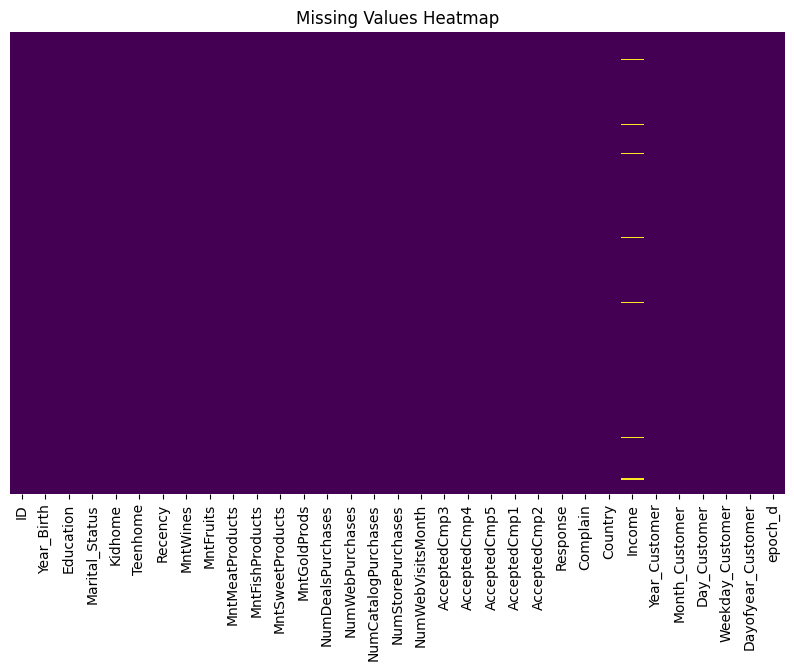

In [41]:
# Date needs to be a Datetime object and converted into its own features
# Income needs converted to a numeric dtype and have all spaces removed
import datetime as dt
mdf.Dt_Customer = pd.to_datetime(mdf.Dt_Customer)
mdf['Income'] = mdf[' Income ']
mdf.drop(columns=[' Income '], inplace=True)
# Replace all non-numeric characters in the income columns
mdf.Income = mdf.Income.str.replace(r'[^\d.]', '', regex=True)
mdf.Income = pd.to_numeric(mdf.Income, errors='coerce')
print(mdf.describe().to_string())
mdf['Year_Customer'] = mdf.Dt_Customer.dt.year
mdf['Month_Customer'] = mdf.Dt_Customer.dt.month
mdf['Day_Customer'] = mdf.Dt_Customer.dt.day
mdf['Weekday_Customer'] = mdf.Dt_Customer.dt.weekday
mdf['Dayofyear_Customer'] = mdf.Dt_Customer.dt.dayofyear
# Convert Datetime to number of days epoch
mdf['epoch_d'] = (mdf['Dt_Customer'] - dt.datetime(1970,1,1)).dt.total_seconds() / 86400.0
# Drop original date column
mdf = mdf.drop(columns=['Dt_Customer'])

# Visualize missing values
plt.figure(figsize=(10, 6))
sns.heatmap(mdf.isnull(), cbar=False, yticklabels=False, cmap='viridis')
plt.title('Missing Values Heatmap')
plt.show()

In [42]:
# Add values for number of children, age, and total spent before imputation, allowing better estimation of missing values
mdf['Num_Children'] = mdf.Kidhome + mdf.Teenhome
mdf['Age'] = 2025 - mdf.Year_Birth
mdf['Total_Spent'] = (mdf.MntWines + mdf.MntFruits + mdf.MntMeatProducts +
                      mdf.MntFishProducts + mdf.MntSweetProducts + mdf.MntGoldProds)

In [43]:
from sklearn.impute import KNNImputer
from sklearn.preprocessing import OneHotEncoder
# Impute missing values in income using KNN Imputer
imputer = KNNImputer(n_neighbors=5)
# One hot encode categorical variables for imputation
categorical_cols = mdf.select_dtypes(include=['object']).columns
ohe = OneHotEncoder(sparse_output=False, handle_unknown='ignore')
categorical_data = ohe.fit_transform(mdf[categorical_cols])
categorical_df = pd.DataFrame(categorical_data, columns=ohe.get_feature_names_out(categorical_cols))
# add one hot encoded columns to mdf and drop original categorical columns
mdf = pd.concat([mdf.drop(columns=categorical_cols).reset_index(drop=True), categorical_df.reset_index(drop=True)], axis=1)
# fit and transform the data
print(mdf.info())
mdf.to_csv('marketing_data_pre_imputation.csv', index=False)  # Save pre-imputation data for reference
mdf_imputed = pd.DataFrame(imputer.fit_transform(mdf), columns=mdf.columns)

print(mdf_imputed.info())
#Print out values that were imputed
missing_income_indices = mdf[mdf['Income'].isnull()].index
print("Imputed Income values at indices:")
for idx in missing_income_indices:
    print(f"Index: {idx}, Imputed Income: {mdf_imputed.loc[idx, 'Income']}")

# Reduct dtypes to lowest possible memory use
for col in mdf_imputed.select_dtypes(include=['float']).columns:
    mdf_imputed[col] = pd.to_numeric(mdf_imputed[col], downcast='float')

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2240 entries, 0 to 2239
Data columns (total 54 columns):
 #   Column                   Non-Null Count  Dtype  
---  ------                   --------------  -----  
 0   ID                       2240 non-null   int64  
 1   Year_Birth               2240 non-null   int64  
 2   Kidhome                  2240 non-null   int64  
 3   Teenhome                 2240 non-null   int64  
 4   Recency                  2240 non-null   int64  
 5   MntWines                 2240 non-null   int64  
 6   MntFruits                2240 non-null   int64  
 7   MntMeatProducts          2240 non-null   int64  
 8   MntFishProducts          2240 non-null   int64  
 9   MntSweetProducts         2240 non-null   int64  
 10  MntGoldProds             2240 non-null   int64  
 11  NumDealsPurchases        2240 non-null   int64  
 12  NumWebPurchases          2240 non-null   int64  
 13  NumCatalogPurchases      2240 non-null   int64  
 14  NumStorePurchases       

3.10.7
0.13.2


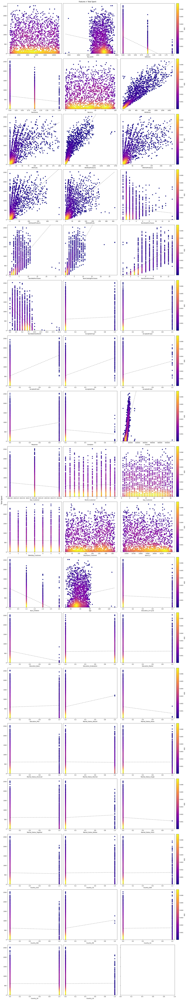

In [44]:
from scipy.stats import gaussian_kde
from math import ceil
import matplotlib
print(matplotlib.__version__)
print(sns.__version__)
def plot_features_vs_col(full_df, col_name):
    df = full_df.copy().drop(columns=[col_name])
    y = full_df[col_name]
    height = ceil(len(df.columns)/3)
    sub_fig, axs = plt.subplots(height,3, sharey=True, figsize=(20,6*height), constrained_layout=True)
    counter = 0
    lkws = {'color':'black', 'linestyle':'--', 'alpha':0.3}
    cbax = []
    for ax, col in zip(axs.flatten(), df.columns):
        df_x = df[col]
        xy = np.vstack([df_x, y])
        dens = gaussian_kde(xy)(xy)
        g = sns.regplot(x=df_x,y=y,ci=False, ax=ax, line_kws=lkws, label='Trend Line')
        g.set(ylim=(0,None))
        plot_scat = ax.scatter(df_x, y, c=dens, cmap='plasma')
        ax.set_xlabel(col)
        ax.set_ylabel('')
        if counter and counter % 3 != 0:
            ax.tick_params(axis='y', which='both', left=False, right=False)
        if counter and (counter+1) % 3 == 0:
            cbax.append(ax)
        counter += 1
        
    sub_fig.suptitle('Features × Total Spent', x=0.47, ha='center')
    sub_fig.supylabel('Total Spent')
    # axs[1].legend(loc='upper left')
    for ax in cbax:
        plt.colorbar(plot_scat, ax=ax, pad=0.01, label='KDE')
    plt.show()
    
plot_features_vs_col(mdf_imputed, 'Total_Spent')

        ID  Year_Birth  Kidhome  Teenhome  Recency  MntWines  MntFruits  \
0   1826.0      1970.0      0.0       0.0      0.0     189.0      104.0   
1      1.0      1961.0      0.0       0.0      0.0     464.0        5.0   
2  10476.0      1958.0      0.0       1.0      0.0     134.0       11.0   
3   1386.0      1967.0      1.0       1.0      0.0      10.0        0.0   
4   5371.0      1989.0      1.0       0.0      0.0       6.0       16.0   

   MntMeatProducts  MntFishProducts  MntSweetProducts  ...  \
0            379.0            111.0             189.0  ...   
1             64.0              7.0               0.0  ...   
2             59.0             15.0               2.0  ...   
3              1.0              0.0               0.0  ...   
4             24.0             11.0               0.0  ...   

   Marital_Status_Widow  Marital_Status_YOLO  Country_AUS  Country_CA  \
0                   0.0                  0.0          0.0         0.0   
1                   0.0       

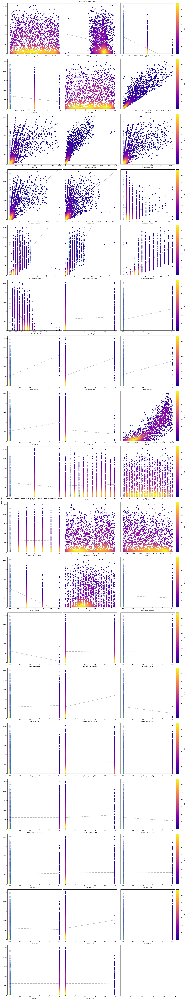

In [45]:
# After checking for trends and looking at outliers, we can perform some final clean up by removing the outliers and imputing the data again
mdf_no_outliers = mdf_imputed.copy()
# Remove outliers based on 10th and 90th percentiles for age and income columns

q_low = mdf_imputed['Age'].quantile(0.1)
q_hi  = mdf_imputed['Age'].quantile(0.9)
mdf_no_outliers['Age'] = mdf_imputed['Age'][(mdf_imputed['Age'] < q_hi) & (mdf_imputed['Age'] > q_low)]
q_low = mdf_imputed['Income'].quantile(0.1)
q_hi  = mdf_imputed['Income'].quantile(0.9)
mdf_no_outliers['Income'] = mdf_imputed['Income'][(mdf_imputed['Income'] < q_hi) & (mdf_imputed['Income'] > q_low)]

print(mdf_no_outliers.head())
# Impute missing values again after removing outliers
mdf_no_outliers_imputed = pd.DataFrame(imputer.fit_transform(mdf_no_outliers), columns=mdf_no_outliers.columns)

# Plot again to see the effect of outlier removal
plot_features_vs_col(mdf_no_outliers_imputed, 'Total_Spent')

 ### Test the following hypotheses: ###


 #### Older individuals may not possess the same level of technological proficiency and may, therefore, lean toward traditional in-store shopping preferences. ####

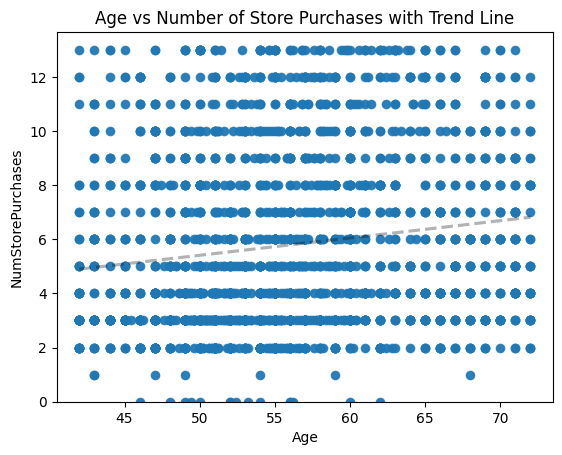

In [46]:
# Plot the distribution of age across number of store purchases ranges as a scatter plot with a trend line
y=mdf_no_outliers_imputed['NumStorePurchases']
col='Age'
df_x = mdf_no_outliers_imputed[col]
lkws = {'color':'black', 'linestyle':'--', 'alpha':0.3}
ax = sns.scatterplot(data=mdf_no_outliers_imputed, x=col, y='NumStorePurchases', sizes=(20, 200), alpha=0.7)
g = sns.regplot(x=df_x,y=y,ci=False, ax=ax, line_kws=lkws, label='Trend Line')
g.set(ylim=(0,None))
plt.title('Age vs Number of Store Purchases with Trend Line')
plt.show()

- Plot shows average number of in store purchases increases slightly with age

#### Customers with children likely experience time constraints, making online shopping a more convenient option. ####

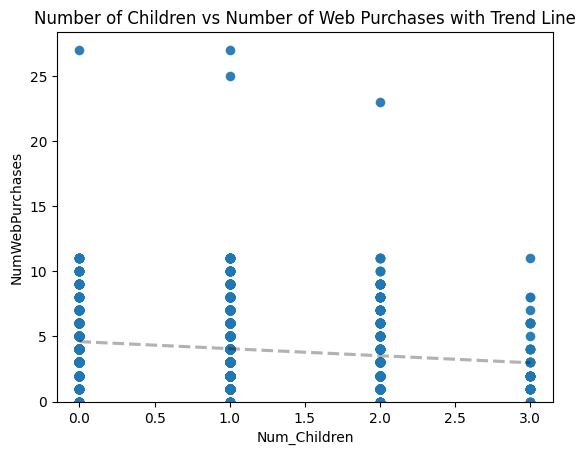

In [47]:
# plot number of kids vs online purchases with scatterplot and trend line
y=mdf_no_outliers_imputed['NumWebPurchases']
col='Num_Children'
df_x = mdf_no_outliers_imputed[col]
lkws = {'color':'black', 'linestyle':'--', 'alpha':0.3}
ax = sns.scatterplot(data=mdf_no_outliers_imputed, x=col, y='NumWebPurchases', sizes=(20, 200), alpha=0.7)
g = sns.regplot(x=df_x,y=y,ci=False, ax=ax, line_kws=lkws, label='Trend Line')
g.set(ylim=(0,None))
plt.title('Number of Children vs Number of Web Purchases with Trend Line')
plt.show()


- This plot shows that there is not a direct correlation between the number of children vs amount of web purchases as the trend average down across more kids
- This might be due to less available income, rather than time saving

#### Sales at physical stores may face the risk of cannibalization by alternative distribution channels. ####

<Figure size 1400x600 with 0 Axes>

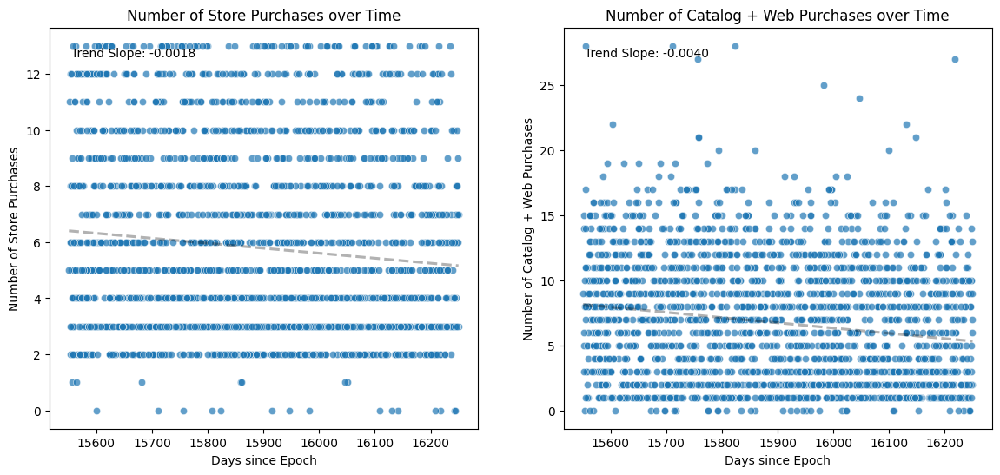

In [67]:
# plot 2 subplos, the physical sales over time vs catalog + web purchases over time with scatterplot and trendlines for each
x=mdf_no_outliers_imputed['epoch_d']
lkws = {'color':'black', 'linestyle':'--', 'alpha':0.3}
y=mdf_no_outliers_imputed['NumStorePurchases']
y2=mdf_no_outliers_imputed['NumCatalogPurchases'] + mdf_no_outliers_imputed['NumWebPurchases']
plt.figure(figsize=(14,6))
fig, axs = plt.subplots(1,2, figsize=(14,6))
# First subplot: Store Purchases over time
sns.scatterplot(x=x, y=y, alpha=0.7, ax=axs[0])
g = sns.regplot(x=x,y=y,ci=False, scatter=False, ax=axs[0], line_kws=lkws, label='Trend Line')
# Second subplot: Catalog + Web Purchases over time
sns.scatterplot(x=x, y=y2, alpha=0.7, ax=axs[1])
g2 = sns.regplot(x=x,y=y2,ci=False, scatter=False, ax=axs[1], line_kws=lkws, label='Trend Line')

# label axes, title
axs[0].set_title('Number of Store Purchases over Time')
axs[0].set_xlabel('Days since Epoch')
axs[0].set_ylabel('Number of Store Purchases')
axs[1].set_title('Number of Catalog + Web Purchases over Time')
axs[1].set_xlabel('Days since Epoch')
axs[1].set_ylabel('Number of Catalog + Web Purchases')
# Print slope of trend line on the trend lines
slope1 = (axs[0].get_lines()[0].get_ydata()[1] - axs[0].get_lines()[0].get_ydata()[0]) / (axs[0].get_lines()[0].get_xdata()[1] - axs[0].get_lines()[0].get_xdata()[0])  # Get slope of first trend line
slope2 = (axs[1].get_lines()[0].get_ydata()[1] - axs[1].get_lines()[0].get_ydata()[0]) / (axs[1].get_lines()[0].get_xdata()[1] - axs[1].get_lines()[0].get_xdata()[0]) # Get slope of second trend line
axs[0].text(0.05, 0.95, f'Trend Slope: {slope1:.4f}', transform=axs[0].transAxes, fontsize=10, verticalalignment='top')
axs[1].text(0.05, 0.95, f'Trend Slope: {slope2:.4f}', transform=axs[1].transAxes, fontsize=10, verticalalignment='top')
plt.show()

- While they trend similarly, the slopes show that catalog + web purchases are trending down faster than the in store purchases
- This shows that in store may not necessarily get cannibalized


#### Does the United States significantly outperform the rest of the world in total purchase volumes? ####

Average Total Spent per Country:
AUS: 561.02
CA: 628.85
GER: 624.27
IND: 537.06
ME: 1040.67
SA: 626.32
SP: 604.77
US: 622.77

Total Volume of Products Purchased per Country:
AUS: 89763.00
CA: 168532.00
GER: 74913.00
IND: 79485.00
ME: 3122.00
SA: 211071.00
SP: 662220.00
US: 67882.00


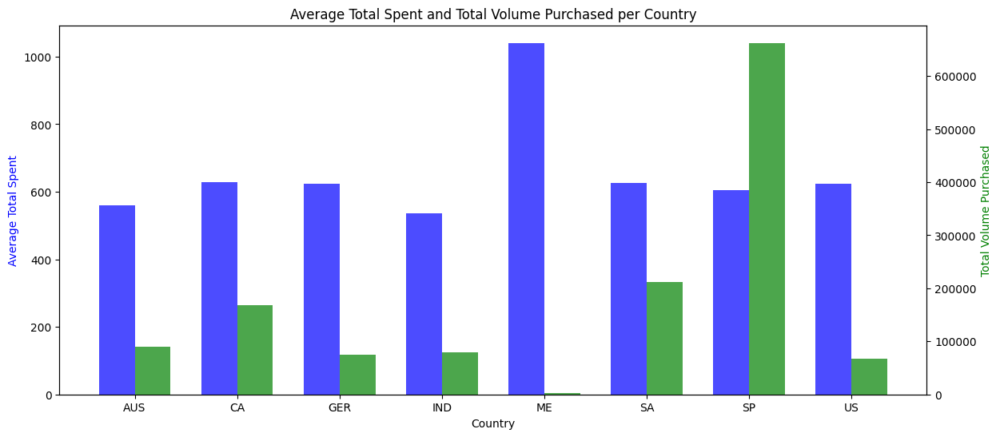

In [72]:
# Use one hot encoded country data to see average total spent per country
country_cols = [col for col in mdf_no_outliers_imputed.columns if col.startswith('Country_')]
avg_spent_per_country = {}
# Get the average total spent per country
for col in country_cols:
    country_name = col.split('_')[1]
    avg_spent = mdf_no_outliers_imputed.loc[mdf_no_outliers_imputed[col] == 1, 'Total_Spent'].mean()
    avg_spent_per_country[country_name] = avg_spent
print("Average Total Spent per Country:")
for country, avg_spent in avg_spent_per_country.items():
    print(f"{country}: {avg_spent:.2f}")
    
# Use same country data to plot volume of data moved from the Mts*Products columns added together for total volume per country
total_volume_per_country = {}
for col in country_cols:
    country_name = col.split('_')[1]
    total_volume = mdf_no_outliers_imputed.loc[mdf_no_outliers_imputed[col] == 1, 
                                               ['MntWines', 'MntFruits', 'MntMeatProducts', 
                                                'MntFishProducts', 'MntSweetProducts', 'MntGoldProds']].sum().sum()
    total_volume_per_country[country_name] = total_volume
print("\nTotal Volume of Products Purchased per Country:")  
for country, total_volume in total_volume_per_country.items():
    print(f"{country}: {total_volume:.2f}")

# Plot total spent and total volume as 2 bar plots side by side for each country
countries = list(avg_spent_per_country.keys())
avg_spent_values = list(avg_spent_per_country.values())
total_volume_values = [total_volume_per_country[country] for country in countries]
x = np.arange(len(countries))  # the label locations
width = 0.35  # the width of the bars
fig, ax1 = plt.subplots(figsize=(14,6))
bars1 = ax1.bar(x - width/2, avg_spent_values, width, label='Average Total Spent', color='b', alpha=0.7)
ax2 = ax1.twinx()  # instantiate a second axes that shares the same x-axis
bars2 = ax2.bar(x + width/2, total_volume_values, width, label='Total Volume Purchased', color='g', alpha=0.7)
# Add some text for labels, title and custom x-axis tick labels, etc.
ax1.set_xlabel('Country')
ax1.set_ylabel('Average Total Spent', color='b')
ax2.set_ylabel('Total Volume Purchased', color='g')
ax1.set_title('Average Total Spent and Total Volume Purchased per Country')
ax1.set_xticks(x)
ax1.set_xticklabels(countries)
plt.show()

- We can see the average total spent is similar across countries while the highes volume purchased goes to SP.
- ME beats the rest for highest average spent, even though they had the lowest volume

### Use appropriate visualization to help analyze the following: ###

#### Identify the top-performing products and those with the lowest revenue. ####

In [74]:
# Get revenue per item category
item_categories = ['MntWines', 'MntFruits', 'MntMeatProducts', 'MntFishProducts', 'MntSweetProducts', 'MntGoldProds']
total_revenue_per_category = {}
# Get the average percentage of sales for each item category and divide that average into the total spent to get revenue per category
for category in item_categories:
    avg_percentage = (mdf_no_outliers_imputed[category] / mdf_no_outliers_imputed['Total_Spent']).mean()
    total_revenue = avg_percentage * mdf_no_outliers_imputed['Total_Spent'].sum()
    total_revenue_per_category[category] = total_revenue
print("Total Revenue per Item Category:")
for category, revenue in total_revenue_per_category.items():
    print(f"{category}: {revenue:.2f}")
# Get per product price and determine best selling product by revenue
product_prices = {}
for category in item_categories:
    total_units_sold = mdf_no_outliers_imputed[category].sum()
    total_revenue = total_revenue_per_category[category]
    price_per_unit = total_revenue / total_units_sold if total_units_sold > 0 else 0
    product_prices[category] = price_per_unit
print("\nPrice per Unit for each Item Category:")
for category, price in product_prices.items():
    print(f"{category}: {price:.2f}")

Total Revenue per Item Category:
MntWines: 622153.70
MntFruits: 67177.11
MntMeatProducts: 338579.38
MntFishProducts: 97068.51
MntSweetProducts: 68904.09
MntGoldProds: 163105.20

Price per Unit for each Item Category:
MntWines: 0.91
MntFruits: 1.14
MntMeatProducts: 0.91
MntFishProducts: 1.15
MntSweetProducts: 1.14
MntGoldProds: 1.65


- This doesn't show operating costs or actual profit per item
- It does show that meats and wines are the most popular top-performing items
- While sweets and fruits are the lowest performing

#### Examine if there is a correlation between customers' age and the acceptance rate of the last campaign. ####

C:\Users\Rick\AppData\Local\Temp\ipykernel_18076\3290092250.py:3: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  accepted_counts = mdf_no_outliers_imputed[mdf_no_outliers_imputed['AcceptedCmp5'] == 1].groupby(age_bins).size()
C:\Users\Rick\AppData\Local\Temp\ipykernel_18076\3290092250.py:4: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  rejected_counts = mdf_no_outliers_imputed[mdf_no_outliers_imputed['AcceptedCmp5'] == 0].groupby(age_bins).size()


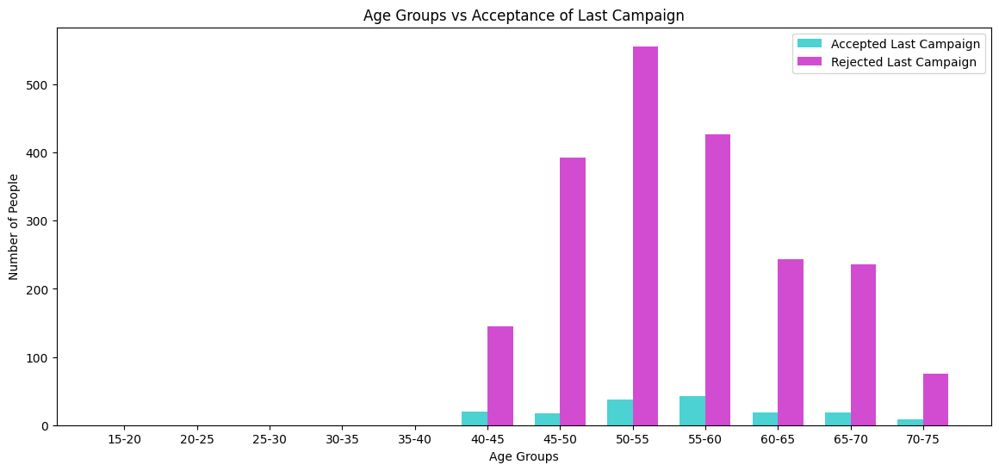

In [ ]:
# Plot bar graphs of age versus people who accpeted the last campaign 
age_bins = pd.cut(mdf_no_outliers_imputed['Age'], bins=range(15, 80, 5))
accepted_counts = mdf_no_outliers_imputed[mdf_no_outliers_imputed['AcceptedCmp5'] == 1].groupby(age_bins).size()
rejected_counts = mdf_no_outliers_imputed[mdf_no_outliers_imputed['AcceptedCmp5'] == 0].groupby(age_bins).size()
x = np.arange(len(accepted_counts))  # the label locations
# Plot these bar graphs side by side similar to last bar graph
fig, ax = plt.subplots(figsize=(14,6))
bars1 = ax.bar(x - width/2, accepted_counts, width, label='Accepted Last Campaign', color='c', alpha=0.7)
bars2 = ax.bar(x + width/2, rejected_counts, width, label='Rejected Last Campaign', color='m', alpha=0.7)
# Add some text for labels, title and custom x-axis tick labels, etc.
ax.set_xlabel('Age Groups')
ax.set_ylabel('Number of People')
ax.set_title('Age Groups vs Acceptance of Last Campaign')
ax.set_xticks(x)
ax.set_xticklabels([f'{int(interval.left)}-{int(interval.right)}' for interval in accepted_counts.index])
ax.legend()
plt.show()

- The campaign seemed most successful with the 50-60 range of individuals
- The lower and higher ends dropped off fairly quickly

#### Determine the country with the highest number of customers who accepted the last campaign. ####

Campaign Acceptance per Country:
AUS: Accepted: 13.0, Rejected: 147.0
CA: Accepted: 21.0, Rejected: 247.0
GER: Accepted: 8.0, Rejected: 112.0
IND: Accepted: 6.0, Rejected: 142.0
ME: Accepted: 0.0, Rejected: 3.0
SA: Accepted: 21.0, Rejected: 316.0
SP: Accepted: 89.0, Rejected: 1006.0
US: Accepted: 5.0, Rejected: 104.0


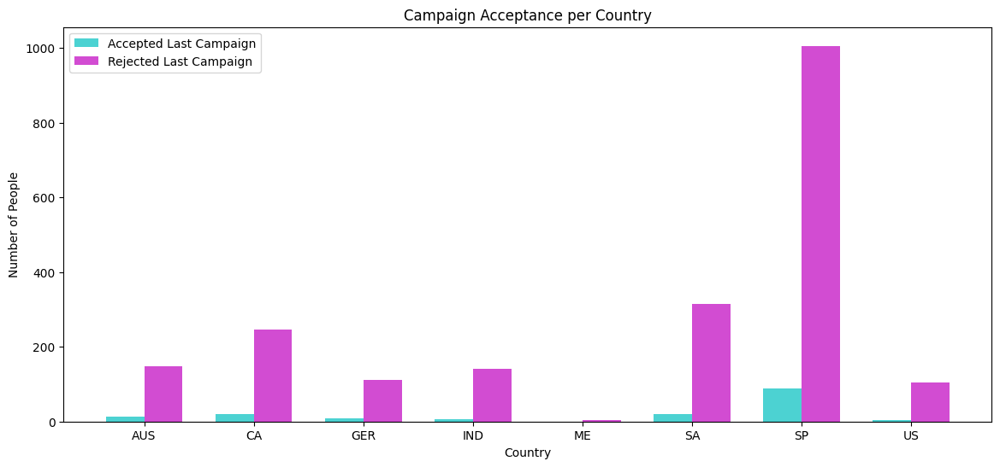

Per Capita Sales and Acceptance Rate per Country:
AUS: Per Capita Sales: 561.02, Acceptance Rate: 0.0813
CA: Per Capita Sales: 628.85, Acceptance Rate: 0.0784
GER: Per Capita Sales: 624.27, Acceptance Rate: 0.0667
IND: Per Capita Sales: 537.06, Acceptance Rate: 0.0405
ME: Per Capita Sales: 1040.67, Acceptance Rate: 0.0000
SA: Per Capita Sales: 626.32, Acceptance Rate: 0.0623
SP: Per Capita Sales: 604.77, Acceptance Rate: 0.0813
US: Per Capita Sales: 622.77, Acceptance Rate: 0.0459


In [80]:
# Use one hot encoded country data to see, per country, how many people accepted vs rejected the last campaign
country_acceptance = {}
for col in country_cols:
    country_name = col.split('_')[1]
    accepted_count = mdf_no_outliers_imputed.loc[mdf_no_outliers_imputed[col] == 1, 'AcceptedCmp5'].sum()
    rejected_count = mdf_no_outliers_imputed.loc[mdf_no_outliers_imputed[col] == 1, 'AcceptedCmp5'].count() - accepted_count
    country_acceptance[country_name] = (accepted_count, rejected_count)
print("Campaign Acceptance per Country:")
for country, (accepted, rejected) in country_acceptance.items():
    print(f"{country}: Accepted: {accepted}, Rejected: {rejected}")
    
# Plot bar graphs of campaign acceptance per country
countries = list(country_acceptance.keys())
accepted_values = [country_acceptance[country][0] for country in countries]
rejected_values = [country_acceptance[country][1] for country in countries]
x = np.arange(len(countries))  # the label locations
# Plot these bar graphs side by side similar to last bar graph
fig, ax = plt.subplots(figsize=(14,6))
bars1 = ax.bar(x - width/2, accepted_values, width, label='Accepted Last Campaign', color='c', alpha=0.7)
bars2 = ax.bar(x + width/2, rejected_values, width, label='Rejected Last Campaign', color='m', alpha=0.7)
# Add some text for labels, title and custom x-axis tick labels, etc.
ax.set_xlabel('Country')
ax.set_ylabel('Number of People')
ax.set_title('Campaign Acceptance per Country')
ax.set_xticks(x)
ax.set_xticklabels(countries)
ax.legend()
plt.show()

# Plot a per capita amount of sales versus the sales acceptance rate per country
per_capita_sales = {}
acceptance_rate = {}
for col in country_cols:
    country_name = col.split('_')[1]
    total_sales = mdf_no_outliers_imputed.loc[mdf_no_outliers_imputed[col] == 1, 'Total_Spent'].sum()
    population = mdf_no_outliers_imputed.loc[mdf_no_outliers_imputed[col] == 1].shape[0]
    accepted_count = mdf_no_outliers_imputed.loc[mdf_no_outliers_imputed[col] == 1, 'AcceptedCmp5'].sum()
    per_capita_sales[country_name] = total_sales / population if population > 0 else 0
    acceptance_rate[country_name] = accepted_count / population if population > 0 else 0
print("Per Capita Sales and Acceptance Rate per Country:")
for country in per_capita_sales.keys():
    print(f"{country}: Per Capita Sales: {per_capita_sales[country]:.2f}, Acceptance Rate: {acceptance_rate[country]:.4f}") 

- As SP had the most sales it makes sense that they had the most acceptance of the campaign
- Checking a per capita acceptance rate might help as well to see which ones were most effective per sale
- In per capita sales per acceptance we can see that acceptance in AUS, CA were nearly if not the same as the highest selling contry, SP

#### Investigate if there is a discernible pattern in the number of children at home and the total expenditure. ####

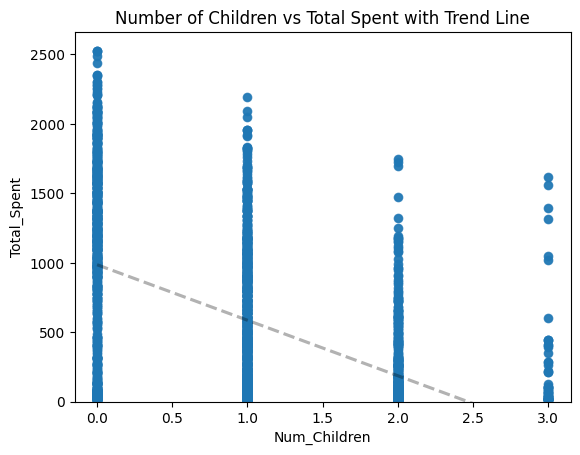

In [81]:
# Plot number of kids vs total spent with scatterplot and trend line
y=mdf_no_outliers_imputed['Total_Spent']
col='Num_Children'
df_x = mdf_no_outliers_imputed[col]
lkws = {'color':'black', 'linestyle':'--', 'alpha':0.3}
ax = sns.scatterplot(data=mdf_no_outliers_imputed, x=col, y='Total_Spent', sizes=(20, 200), alpha=0.7)
g = sns.regplot(x=df_x,y=y,ci=False, ax=ax, line_kws=lkws, label='Trend Line')
g.set(ylim=(0,None))
plt.title('Number of Children vs Total Spent with Trend Line')
plt.show()

- This was sort of expected after the previous plot of the number of kids vs number of sales
    - As that previous plot also went down, it makes sense that the amount of sales also goes down as number of kids in the house goes up

#### Analyze the educational background of customers who lodged complaints in the last two years. ####

In [84]:
# Plot one hot encoded education levels vs the sum of complaints reported with a bar plot
education_cols = [col for col in mdf_no_outliers_imputed.columns if col.startswith('Education_')]
complaint_sums = {}
for col in education_cols:
    education_level = col.split('_')[1]
    total_complaints = mdf_no_outliers_imputed.loc[mdf_no_outliers_imputed[col] == 1, 
                                                   ['Complain']].sum().values[0]
    complaint_sums[education_level] = total_complaints
print("Total Complaints per Education Level:")
for education_level, total_complaints in complaint_sums.items():
    print(f"{education_level}: {total_complaints}")

Total Complaints per Education Level:
2n Cycle: 4.0
Basic: 0.0
Graduation: 14.0
Master: 2.0
PhD: 1.0


- While this makes sense that, on average, more educated people might be more analytical and complain more
    - We might want to check at the average amount (per capita) of complaints from each education level
    - If you have a high distribution of Graduated people, you might seem to get better responses when it is just an over-representation